In [1]:
import os
import pandas as pd
from lbl2vec import Lbl2Vec
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import strip_tags
from gensim.models.doc2vec import TaggedDocument
import requests
from bs4 import BeautifulSoup
import random

c:\ProgramData\anaconda3\envs\myenv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-03-03 22:20:18,508	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
c:\ProgramData\anaconda3\envs\myenv\Lib\site-packages\torch\_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


In [2]:
def hungarian_word_scraper():
    hungarian_words = []

    # URL of the webpage you want to scrape
    url = 'http://corpus.nytud.hu/cgi-bin/mnszgyak?mode=word&ppos=N&focus=&context=c0&sort=total'

    # Send a GET request to the webpage
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Parse the HTML content of the page
        soup = BeautifulSoup(response.text, 'html.parser')
        
        # Find all instances where the class is 'word', which should follow the structure you've described
        word_elements = soup.find_all('td', class_='word')
        
        # Extract and print the words and any additional information you want
        for word_element in word_elements:
            # Extracting the word text
            word = word_element.text.strip()
            
            # If there are additional details you want to extract, you can navigate to sibling or parent tags as needed
            # For example, to get the rank which might be in a previous <td>:
            # rank = word_element.find_previous_sibling('td', class_='rank').text.strip()
            
            hungarian_words.append(word.lower().replace("á", "a").replace("é", "e").replace("í", "i").replace("ó", "o").replace("ö", "o").replace("ő", "o").replace("ú", "u").replace("ü", "u").replace("ű", "u"))
            # If you extracted more details, print them here as well
    else:
        print(f'Failed to fetch the webpage. Status code: {response.status_code}')
    
    return hungarian_words

In [3]:
# doc: document text string
# returns tokenized document
# strip_tags removes meta tags from the text
# simple preprocess converts a document into a list of lowercase tokens, ignoring tokens that are too short or too long 
# simple preprocess also removes numerical values as well as punktuation characters
def tokenize(doc):
    return simple_preprocess(strip_tags(doc), deacc=True, min_len=2, max_len=15)

In [4]:
path = "txt_tak"

file_contents = []
for txt in os.listdir(path):
    with open(os.path.join(path, txt)) as file:
        file_content = file.read()
    file_contents.append(file_content)

# Create a DataFrame with these strings
df = pd.DataFrame(file_contents, columns=['tak'])
df['tagged_docs'] = df.apply(lambda row: TaggedDocument(tokenize(row['tak']), [str(row.name)]), axis=1)
df['doc_key'] = df.index.astype(str)

hungarian_words = hungarian_word_scraper()

In [5]:
full_describes = []
full_distributions = []
sub_describes = []
sub_distributions = []


for _ in range(100):
    # FULL

    keyword_list = [["identitas", "helyi", "hely", "szelleme", "imazs", "marka", "telepuleskepi", "arculati", "karakteru", "telepuleskep"], 
                    random.sample(hungarian_words, 10)]
    label_names = ["telepulesmarketing", "random"]


    # init model with parameters
    Lbl2Vec_model = Lbl2Vec(keywords_list=keyword_list, tagged_documents=df['tagged_docs'], label_names=label_names, similarity_threshold=0.5, min_count=0, min_num_docs=2, epochs=10)

    # train model
    Lbl2Vec_model.fit()

    df_pred = Lbl2Vec_model.predict_model_docs()

    full_describe = df_pred.describe()
    full_describe.to_csv(f"results\\full\\describe\\{'_'.join(keyword_list[1])}.csv", index=True)
    full_describes.append(full_describe)

    full_distribution = df_pred["most_similar_label"].value_counts(normalize=True)
    full_distribution.to_csv(f"results\\full\\distribution\\{'_'.join(keyword_list[1])}.csv", index=True)
    full_distributions.append(full_distribution)


    keyword_sublist = [["epiteszeti", "vedett", "helyi", "tortenelmi", "termeszeti", "kulturalis", "orokseg", "vilagorokseg", "vilagoroksegi", "viz"],
                       ["epuletek", "lakohaz", "telepules", "varos", "falu", "haz", "lakohaz", "lakoterulet", "kozossegi", "kozlekedesi"],
                       ["ipari", "park", "mezogazdasagi", "gazdasagi", "forras", "muszaki", "szabalyozasi", "ipar", "gazdasag", "kozigazgatasi"],
                       keyword_list[1]]
    sublabel_names = ["turizmus", "lakohely", "telephely", "random"]

    # SUB

    sub_df = df[df_pred["most_similar_label"] == "telepulesmarketing"].copy()

    # init model with parameters
    Lbl2Vec_submodel = Lbl2Vec(keywords_list=keyword_sublist, tagged_documents=sub_df['tagged_docs'], label_names=sublabel_names, similarity_threshold=0.5, min_count=0, min_num_docs=2, epochs=10)

    # train model
    Lbl2Vec_submodel.fit()

    sub_df_pred = Lbl2Vec_submodel.predict_model_docs()

    sub_describe = sub_df_pred.describe()
    sub_describe.to_csv(f"results\\sub\\describe\\{'_'.join(keyword_list[1])}.csv", index=True)
    sub_describes.append(sub_describe)

    sub_distribution = sub_df_pred["most_similar_label"].value_counts(normalize=True)
    sub_distribution.to_csv(f"results\\sub\\distribution\\{'_'.join(keyword_list[1])}.csv", index=True)
    sub_distributions.append(sub_distribution)

    

2024-03-03 22:20:28,951 - Lbl2Vec - INFO - Train document and word embeddings
2024-03-03 22:21:18,834 - Lbl2Vec - INFO - Train label embeddings
2024-03-03 22:21:18,840 - Lbl2Vec - WARNING - The following keywords from the 'keywords_list' are unknown to the Doc2Vec model and therefore not used to train the model: marka
2024-03-03 22:21:18,863 - Lbl2Vec - INFO - Get document embeddings from model
2024-03-03 22:21:18,864 - Lbl2Vec - INFO - Calculate document<->label similarities
2024-03-03 22:21:18,967 - Lbl2Vec - INFO - Train document and word embeddings
2024-03-03 22:21:18,967 - Lbl2Vec - INFO - Train document and word embeddings
2024-03-03 22:21:49,084 - Lbl2Vec - INFO - Train label embeddings
2024-03-03 22:21:49,084 - Lbl2Vec - INFO - Train label embeddings
2024-03-03 22:21:49,092 - Lbl2Vec - WARNING - The following keywords from the 'keywords_list' are unknown to the Doc2Vec model and therefore not used to train the model: hirt
2024-03-03 22:21:49,092 - Lbl2Vec - WARNING - The follow

In [36]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

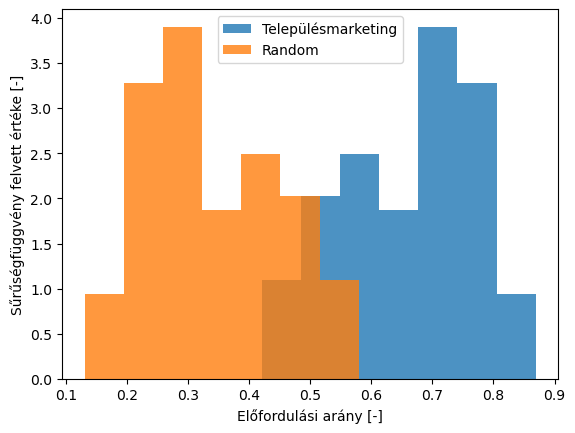

In [32]:
plt.hist([fd.telepulesmarketing for fd in full_distributions], bins=7, density=True, alpha=0.8, label="Településmarketing")
plt.hist([fd.random for fd in full_distributions], bins=7, density=True, alpha=0.8, label="Random")
plt.ylabel("Sűrűségfüggvény felvett értéke [-]")
plt.xlabel("Előfordulási arány [-]")
plt.legend()

In [59]:
fd_data = [fd.telepulesmarketing for fd in full_distributions]

# calcultation
avg = np.mean(fd_data)
std_hiba = np.std(fd_data, ddof=99) / np.sqrt(len(fd_data))

# t-test against avg < 0.5
t_stat, p_val = stats.ttest_1samp(fd_data, 0.5)

avg, std_hiba, t_stat, p_val

(0.660373831775701,
 0.1140280370001846,
 13.993922201538432,
 3.387496663203742e-25)

In [51]:
sd_data_random = [sd.random if "random" in sd.index else 0 for sd in sub_distributions]
print("random", sum(sd_data_random) / len(sd_data_random))

random 0.23907353303427062


In [52]:
sd_data_telephely = [sd.telephely if "telephely" in sd.index else 0 for sd in sub_distributions]
print("telephely", sum(sd_data_telephely) / len(sd_data_telephely))

telephely 0.2256099233335253


In [53]:
sd_data_turizmus = [sd.turizmus if "turizmus" in sd.index else 0 for sd in sub_distributions]
print("turizmus", sum(sd_data_turizmus) / len(sd_data_turizmus))

turizmus 0.2122861728636321


In [54]:
sd_data_lakohely = [sd.lakohely if "lakohely" in sd.index else 0 for sd in sub_distributions]
print("lakohely", sum(sd_data_lakohely) / len(sd_data_lakohely))

lakohely 0.3230303707685719


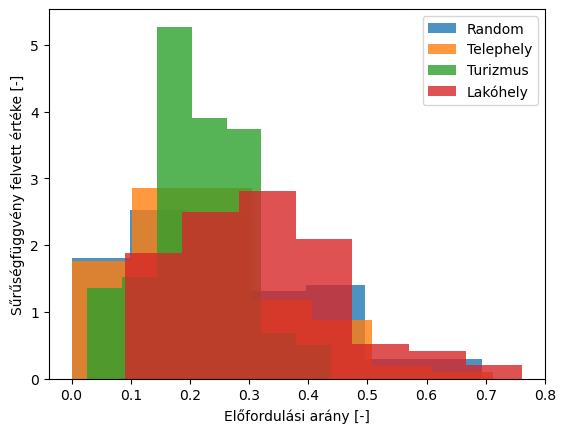

In [56]:
plt.hist(sd_data_random, bins=7, density=True, alpha=0.8, label="Random")
plt.hist(sd_data_telephely, bins=7, density=True, alpha=0.8, label="Telephely")
plt.hist(sd_data_turizmus, bins=7, density=True, alpha=0.8, label="Turizmus")
plt.hist(sd_data_lakohely, bins=7, density=True, alpha=0.8, label="Lakóhely")
plt.ylabel("Sűrűségfüggvény felvett értéke [-]")
plt.xlabel("Előfordulási arány [-]")
plt.legend()

In [62]:
# calcultation
avg = np.mean(sd_data_lakohely)
std_hiba = np.std(sd_data_lakohely, ddof=99) / np.sqrt(len(sd_data_lakohely))

# t-test against avg < 0.25
t_stat, p_val = stats.ttest_1samp(fd_data, 0.25)

print(avg, std_hiba, t_stat, p_val)

0.3230303707685719 0.13458403142121642 35.80845710195527 1.817090082297188e-58
